# Kaggle Instacart Competition - Aditi, Yang Yang, & Josh

We start off importing all of the packages we use the throughout this notebook

In [3]:
# For data manipulation
import pandas as pd 
import numpy as np

# For visualization
import seaborn as sns
import matplotlib.pyplot as plt

# For resource utilization
import os
import psutil # For checking on memory utilization
 
# For model and metrics  
import lightgbm as lgb
from sklearn.metrics import f1_score, confusion_matrix
from sklearn.model_selection import GridSearchCV

import warnings
warnings.filterwarnings('ignore')

In [4]:
# Always check to make sure we are in the right directory
cwd = os.getcwd()
cwd

'/home/ubuntu/github/W207-InstacartKaggle'

In [5]:
# Change our working directory to the correct path
os.chdir('/home/ubuntu/data')

## We begin loading in all of the data provided by Kaggle

In [6]:
aisles = pd.read_csv('/home/ubuntu/data/aisles.csv', engine='c')
print('Total aisles: {}'.format(aisles.shape[0]))
aisles.head()

Total aisles: 134


,aisle_id,aisle
0,1,prepared soups salads
1,2,specialty cheeses
2,3,energy granola bars
3,4,instant foods
4,5,marinades meat preparation


In [7]:
# We check the memory intermittently to make sure we aren't pushing the limits
psutil.virtual_memory()

svmem(total=33737302016, available=19955097600, percent=40.9, used=13423386624, free=19056943104, active=14402727936, inactive=95764480, buffers=26599424, cached=1230372864, shared=17584128)

In [8]:
departments = pd.read_csv('/home/ubuntu/data/departments.csv', engine='c')
print('Total departments: {}'.format(departments.shape[0]))
departments.head(5)

Total departments: 21


,department_id,department
0,1,frozen
1,2,other
2,3,bakery
3,4,produce
4,5,alcohol


In [9]:
products = pd.read_csv('/home/ubuntu/data/products.csv', engine='c')
print('Total products: {}'.format(products.shape[0]))
products.head(5)

Total products: 49688


,product_id,product_name,aisle_id,department_id
0,1,Chocolate Sandwich Cookies,61,19
1,2,All-Seasons Salt,104,13
2,3,Robust Golden Unsweetened Oolong Tea,94,7
3,4,Smart Ones Classic Favorites Mini Rigatoni Wit...,38,1
4,5,Green Chile Anytime Sauce,5,13


In [10]:
orders = pd.read_csv('/home/ubuntu/data/orders.csv', engine='c')
print('Total ordered products(prior): {}'.format(orders.shape[0])) # 3M+ large
print('Unique Evaluation Set:', orders.eval_set.unique()) # Check the data
orders.head(5)

Total ordered products(prior): 3421083
Unique Evaluation Set: ['prior' 'train' 'test']


,order_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order
0,2539329,1,prior,1,2,8,NaN
1,2398795,1,prior,2,3,7,15.0
2,473747,1,prior,3,3,12,21.0
3,2254736,1,prior,4,4,7,29.0
4,431534,1,prior,5,4,15,28.0


In [11]:
op_prior = pd.read_csv('/home/ubuntu/data/order_products__prior.csv', engine='c', 
                       dtype={'order_id': np.int32, 'product_id': np.int32, 
                              'add_to_cart_order': np.int16, 'reordered': np.int8})    
print('Total ordered products(train): {}'.format(op_prior.shape[0]))
op_prior.head(5)

Total ordered products(train): 32434489


,order_id,product_id,add_to_cart_order,reordered
0,2,33120,1,1
1,2,28985,2,1
2,2,9327,3,0
3,2,45918,4,1
4,2,30035,5,0


In [12]:
op_train = pd.read_csv('/home/ubuntu/data/order_products__train.csv', engine='c', 
                       dtype={'order_id': np.int32, 'product_id': np.int32, 
                              'add_to_cart_order': np.int16, 'reordered': np.int8})    
print('Total ordered products(train): {}'.format(op_train.shape[0]))
op_train.head()

Total ordered products(train): 1384617


,order_id,product_id,add_to_cart_order,reordered
0,1,49302,1,1
1,1,11109,2,1
2,1,10246,3,0
3,1,49683,4,0
4,1,43633,5,1


## The two data sets below were created using SQL scripts on MS SQL server.

In [13]:
user_df = pd.read_csv('/home/ubuntu/data/InstacartUsers.csv', engine='c') 
                      # dtype={'user_id': np.int32, 'usr_distinct_prd': np.int32, 
                       #       'usr_total_prod': np.int32, 'reorder_ratio': np.float64,
                        #      'max_basketsize': np.int32, 'mean_days_since_prior': np.float64,
                         #     'eval_set'})    
print('Dimensions of users_df',user_df.shape)
user_df.head()

Dimensions of users_df (206209, 8)


,user_id,usr_distinct_prd,usr_total_prod,reorder_ratio,max_basketsize,mean_days_since_prior,eval_set,order_id
0,48895,199,400,0.037521,27,11.592593,train,1556447
1,54768,97,197,0.029283,30,11.166667,train,3059198
2,70793,63,97,0.053968,12,13.333333,test,2943081
3,163239,44,56,0.107143,3,20.000000,test,3020191
4,177462,72,366,0.063185,23,13.956522,test,1593570


In [14]:
products_x_userid = pd.read_csv('/home/ubuntu/data/OrdersXProductsGroupBy.csv', engine='c', header = None)
print('Dimensions of products_x_userid',products_x_userid.shape)
products_x_userid.columns = ['user_id', 'product_id', 'min_order_number','max_order_number','mean_cart_position']
products_x_userid.head()

Dimensions of products_x_userid (13307953, 5)


,user_id,product_id,min_order_number,max_order_number,mean_cart_position
0,100557,1,4,4,3
1,104162,1,2,9,6
2,104670,1,27,33,3
3,107775,1,14,20,7
4,10789,1,10,16,2


## In this section, we begin to shape the data and create features

In [15]:
# Adding the user ID to the orders training data
op_train = pd.merge(op_train, orders[['order_id', 'user_id']], how='inner', on='order_id')

In [16]:
# Associating aisles and departments with the product
prods = pd.merge(products, aisles, how="inner", on="aisle_id")
prods = pd.merge(prods, departments, how="inner", on="department_id")

# Deleting unnecessary rows and dfs
prods = prods.drop(['aisle_id', 'department_id'],axis=1)
del aisles, departments

# Seeing is believing
prods.head()

,product_id,product_name,aisle,department
0,1,Chocolate Sandwich Cookies,cookies cakes,snacks
1,78,Nutter Butter Cookie Bites Go-Pak,cookies cakes,snacks
2,102,Danish Butter Cookies,cookies cakes,snacks
3,172,Gluten Free All Natural Chocolate Chip Cookies,cookies cakes,snacks
4,285,Mini Nilla Wafers Munch Pack,cookies cakes,snacks


In [17]:
# Here we create a data frame that connect the information on prior orders with the order information
orders_x_prior = pd.merge(orders,op_prior, how="inner", on="order_id")

In [18]:
# You will notice that we are now only dealing with an evaluation set of prior
orders_x_prior.eval_set.unique()

array(['prior'], dtype=object)

In [19]:
# Joining the products data with the data on orders and consumers
data = pd.merge(products_x_userid, user_df, how='inner', on='user_id')
data = pd.merge(data, prods, how='inner', on='product_id')
data.shape

(13307953, 15)

In [20]:
# Quick cleaning from the merge
data = data.rename(columns = {'user_id_x':'user_id'})

In [21]:
data.head()

,user_id,product_id,min_order_number,max_order_number,mean_cart_position,usr_distinct_prd,usr_total_prod,reorder_ratio,max_basketsize,mean_days_since_prior,eval_set,order_id,product_name,aisle,department
0,100557,1,4,4,3,16,23,0.064815,9,15.666667,test,336539,Chocolate Sandwich Cookies,cookies cakes,snacks
1,104162,1,2,9,6,48,98,0.097656,10,26.100000,train,1579878,Chocolate Sandwich Cookies,cookies cakes,snacks
2,104670,1,27,33,3,66,160,0.031208,36,7.694444,train,1776457,Chocolate Sandwich Cookies,cookies cakes,snacks
3,107775,1,14,20,7,38,96,0.049069,20,12.700000,train,3120862,Chocolate Sandwich Cookies,cookies cakes,snacks
4,10789,1,10,16,2,21,87,0.041096,36,8.777778,train,114834,Chocolate Sandwich Cookies,cookies cakes,snacks


In [20]:
# Good time to check memory!
psutil.virtual_memory()

svmem(total=33737302016, available=25786245120, percent=23.6, used=7592824832, free=24920010752, active=8571260928, inactive=80482304, buffers=24322048, cached=1200144384, shared=17580032)

In [22]:
# Lastly, bringing the training data back into the mix

data = pd.merge(data, op_train[['user_id','product_id', 'reordered']], how='left', on=['product_id','user_id'])

In [23]:
# Making Sure Our Target Is Intact

op_train['reordered'].value_counts()

data['reordered'].value_counts() # Making sure our target is still intact!

1.0    828824
Name: reordered, dtype: int64

## Splitting the data based on predesignated coding

In [24]:
df_train = data[data.eval_set == 'train']
df_test = data[data.eval_set == 'test']

In [25]:
df_train.head()

,user_id,product_id,min_order_number,max_order_number,mean_cart_position,usr_distinct_prd,usr_total_prod,reorder_ratio,max_basketsize,mean_days_since_prior,eval_set,order_id,product_name,aisle,department,reordered
1,104162,1,2,9,6,48,98,0.097656,10,26.100000,train,1579878,Chocolate Sandwich Cookies,cookies cakes,snacks,NaN
2,104670,1,27,33,3,66,160,0.031208,36,7.694444,train,1776457,Chocolate Sandwich Cookies,cookies cakes,snacks,NaN
3,107775,1,14,20,7,38,96,0.049069,20,12.700000,train,3120862,Chocolate Sandwich Cookies,cookies cakes,snacks,NaN
4,10789,1,10,16,2,21,87,0.041096,36,8.777778,train,114834,Chocolate Sandwich Cookies,cookies cakes,snacks,NaN
5,110040,1,28,6,2,49,349,0.018227,82,4.341463,train,1692257,Chocolate Sandwich Cookies,cookies cakes,snacks,NaN


In [25]:
# Looks like we need to clear some memory!
psutil.virtual_memory()
#del data, products_x_userid

svmem(total=33737302016, available=22159372288, percent=34.3, used=11219673088, free=21293109248, active=12191137792, inactive=80482304, buffers=24363008, cached=1200156672, shared=17580032)

In [26]:
# The first order by definition can have no reordered products, so we set this variable to 0 in this case
df_train['reordered'].fillna(0,inplace=True)

# Checking that we have only the values we expect
df_train.reordered.unique()

array([ 0.,  1.])

In [27]:
# Setting the target or labels for our model
target_train = df_train.loc[:,'reordered']

In [28]:
# We choose our features and create a df based on them alone
feat_for_use = ['min_order_number', 'max_order_number', 'usr_distinct_prd',
                'usr_total_prod', 'mean_cart_position', 'reorder_ratio',
                'max_basketsize','mean-days_since_prior'
               ]
df_train = df_train.loc[:,feat_for_use]

## Grid Search for parameter tuning

In [29]:
# We played around with this to see what worked well
# We tried to pass multiple parameters but that usually would blow up the grid search. Other parameters that we mannually explored
# are mentioned in comments
estimator = lgb.LGBMClassifier()

param_grid = {
    'learning_rate': [0.1], #[0.01, 0.8]
    'n_estimators': [100], #[10, 1000]
    'subsample': [0.75],
    'max_depth': [4] #[1,2,3]
}

gbm = GridSearchCV(estimator, param_grid)

gbm.fit(df_train, target_train)

GridSearchCV(cv=None, error_score='raise',
       estimator=LGBMClassifier(boosting_type='gbdt', colsample_bytree=1, learning_rate=0.1,
        max_bin=255, max_depth=-1, min_child_samples=10,
        min_child_weight=5, min_split_gain=0, n_estimators=10, nthread=-1,
        num_leaves=31, objective='binary', reg_alpha=0, reg_lambda=0,
        seed=0, silent=True, subsample=1, subsample_for_bin=50000,
        subsample_freq=1),
       fit_params={}, iid=True, n_jobs=1,
       param_grid={'learning_rate': [0.1], 'n_estimators': [100], 'subsample': [0.75], 'max_depth': [4]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring=None, verbose=0)

In [ ]:
# You may need to get rid of prior data sets in order to run the above search
del op_prior, op_train, orders, orders_x_prior, products, user_df

In [ ]:
# The best parameters from the grid search
print(gbm.best_params_)

In [30]:
df_test = df_test.loc[:, feat_for_use]

In [31]:
y_pred = gbm.predict(df_test)

[[ 0.95346823  0.04653177]
 [ 0.90141824  0.09858176]
 [ 0.97716781  0.02283219]
 ..., 
 [ 0.90132025  0.09867975]
 [ 0.96102594  0.03897406]
 [ 0.89559456  0.10440544]]


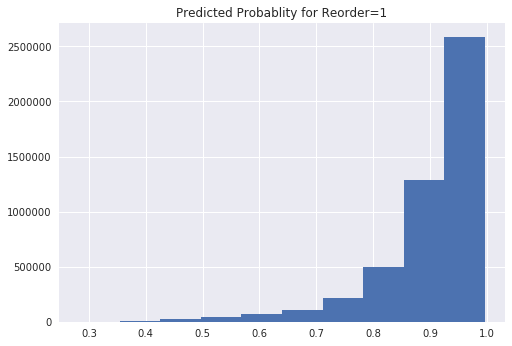

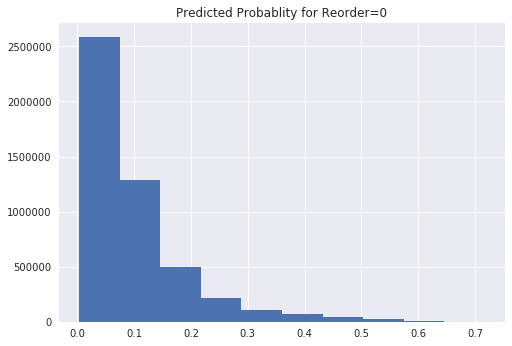

In [48]:
def G1():
    import matplotlib.pyplot as plt
    
    temp = gbm.predict_proba(df_test)
    print(temp)
    plt.hist(temp[:,0])
    plt.title("Predicted Probablity for Reorder=1")
    plt.show()
    
    plt.hist(temp[:,1])
    plt.title("Predicted Probablity for Reorder=0")
    plt.show()
    

G1()

In [32]:
y_pred.min()

0.0

In [33]:
y_pred.max()

1.0

In [34]:

THRESHOLD = 0.22

tp = df_test[['user_id', 'product_id', 'order_id']].copy()
tp['reordered'] = (gbm.predict_proba(df_test).values)[:,1] > .22).astype(int)
tp.product_id = tp.product_id.astype(str)

g = tp[tp.reordered == 1].groupby('order_id', sort=False)
df_tp = g[['product_id']].agg(lambda x: ' '.join(set(x)))

df_tp.head()


SyntaxError: invalid syntax (<ipython-input-34-9939b2ab2559>, line 6)

In [33]:
for row in df_test.itertuples():
    print(row)

Pandas(Index=0, min_order_number=4, max_order_number=4, usr_distinct_prd=16, usr_total_prod=23, mean_cart_position=3, reorder_ratio=0.064814814999999998, max_basketsize=9, _8=nan, pred=0.0)
Pandas(Index=7, min_order_number=32, max_order_number=32, usr_distinct_prd=37, usr_total_prod=99, mean_cart_position=1, reorder_ratio=0.036257310000000001, max_basketsize=36, _8=nan, pred=0.0)
Pandas(Index=8, min_order_number=2, max_order_number=2, usr_distinct_prd=14, usr_total_prod=43, mean_cart_position=5, reorder_ratio=0.072139303000000002, max_basketsize=16, _8=nan, pred=0.0)
Pandas(Index=9, min_order_number=20, max_order_number=20, usr_distinct_prd=258, usr_total_prod=598, mean_cart_position=15, reorder_ratio=0.024541648999999999, max_basketsize=45, _8=nan, pred=0.0)
Pandas(Index=13, min_order_number=1, max_order_number=1, usr_distinct_prd=10, usr_total_prod=11, mean_cart_position=5, reorder_ratio=0.047619047999999997, max_basketsize=4, _8=nan, pred=0.0)
Pandas(Index=14, min_order_number=2, ma

Pandas(Index=4280, min_order_number=1, max_order_number=9, usr_distinct_prd=136, usr_total_prod=253, mean_cart_position=11, reorder_ratio=0.08660251699999999, max_basketsize=9, _8=nan, pred=0.0)
Pandas(Index=4281, min_order_number=10, max_order_number=62, usr_distinct_prd=187, usr_total_prod=462, mean_cart_position=4, reorder_ratio=0.016490765000000001, max_basketsize=71, _8=nan, pred=0.0)
Pandas(Index=4286, min_order_number=28, max_order_number=39, usr_distinct_prd=77, usr_total_prod=257, mean_cart_position=4, reorder_ratio=0.030837758999999999, max_basketsize=39, _8=nan, pred=0.0)
Pandas(Index=4288, min_order_number=10, max_order_number=10, usr_distinct_prd=209, usr_total_prod=607, mean_cart_position=3, reorder_ratio=0.024468216000000001, max_basketsize=49, _8=nan, pred=0.0)
Pandas(Index=4289, min_order_number=11, max_order_number=49, usr_distinct_prd=147, usr_total_prod=264, mean_cart_position=3, reorder_ratio=0.018258427000000001, max_basketsize=50, _8=nan, pred=0.0)
Pandas(Index=4

Pandas(Index=8482, min_order_number=19, max_order_number=20, usr_distinct_prd=138, usr_total_prod=179, mean_cart_position=7, reorder_ratio=0.019016698000000002, max_basketsize=20, _8=nan, pred=0.0)
Pandas(Index=8488, min_order_number=1, max_order_number=8, usr_distinct_prd=102, usr_total_prod=195, mean_cart_position=3, reorder_ratio=0.042778289000000004, max_basketsize=19, _8=nan, pred=0.0)
Pandas(Index=8491, min_order_number=11, max_order_number=8, usr_distinct_prd=161, usr_total_prod=316, mean_cart_position=6, reorder_ratio=0.036747273999999996, max_basketsize=27, _8=nan, pred=0.0)
Pandas(Index=8495, min_order_number=2, max_order_number=3, usr_distinct_prd=115, usr_total_prod=308, mean_cart_position=2, reorder_ratio=0.03380035, max_basketsize=37, _8=nan, pred=0.0)
Pandas(Index=8496, min_order_number=22, max_order_number=22, usr_distinct_prd=105, usr_total_prod=295, mean_cart_position=8, reorder_ratio=0.045066414000000006, max_basketsize=27, _8=nan, pred=0.0)
Pandas(Index=8499, min_or

Pandas(Index=12972, min_order_number=3, max_order_number=3, usr_distinct_prd=35, usr_total_prod=44, mean_cart_position=5, reorder_ratio=0.12857142900000001, max_basketsize=3, _8=nan, pred=0.0)
Pandas(Index=12974, min_order_number=30, max_order_number=30, usr_distinct_prd=160, usr_total_prod=329, mean_cart_position=6, reorder_ratio=0.023941067999999999, max_basketsize=44, _8=nan, pred=0.0)
Pandas(Index=12975, min_order_number=11, max_order_number=11, usr_distinct_prd=104, usr_total_prod=166, mean_cart_position=2, reorder_ratio=0.025399425999999999, max_basketsize=27, _8=nan, pred=0.0)
Pandas(Index=12977, min_order_number=12, max_order_number=3, usr_distinct_prd=66, usr_total_prod=130, mean_cart_position=1, reorder_ratio=0.059757235999999998, max_basketsize=14, _8=nan, pred=0.0)
Pandas(Index=12982, min_order_number=1, max_order_number=2, usr_distinct_prd=161, usr_total_prod=548, mean_cart_position=9, reorder_ratio=0.030910542999999999, max_basketsize=45, _8=nan, pred=0.0)
Pandas(Index=12

Pandas(Index=17283, min_order_number=11, max_order_number=9, usr_distinct_prd=149, usr_total_prod=242, mean_cart_position=4, reorder_ratio=0.056432039000000003, max_basketsize=11, _8=nan, pred=0.0)
Pandas(Index=17286, min_order_number=66, max_order_number=66, usr_distinct_prd=133, usr_total_prod=775, mean_cart_position=11, reorder_ratio=0.016430783000000001, max_basketsize=99, _8=nan, pred=0.0)
Pandas(Index=17294, min_order_number=1, max_order_number=99, usr_distinct_prd=229, usr_total_prod=1517, mean_cart_position=5, reorder_ratio=0.01813012, max_basketsize=99, _8=nan, pred=0.0)
Pandas(Index=17295, min_order_number=1, max_order_number=8, usr_distinct_prd=73, usr_total_prod=145, mean_cart_position=10, reorder_ratio=0.10975609800000001, max_basketsize=9, _8=nan, pred=0.0)
Pandas(Index=17296, min_order_number=10, max_order_number=9, usr_distinct_prd=183, usr_total_prod=544, mean_cart_position=18, reorder_ratio=0.054416642000000001, max_basketsize=29, _8=nan, pred=0.0)
Pandas(Index=17297,

Pandas(Index=21634, min_order_number=3, max_order_number=5, usr_distinct_prd=107, usr_total_prod=135, mean_cart_position=2, reorder_ratio=0.068126520999999995, max_basketsize=5, _8=nan, pred=0.0)
Pandas(Index=21635, min_order_number=5, max_order_number=5, usr_distinct_prd=270, usr_total_prod=535, mean_cart_position=27, reorder_ratio=0.027518172, max_basketsize=34, _8=nan, pred=0.0)
Pandas(Index=21637, min_order_number=5, max_order_number=5, usr_distinct_prd=93, usr_total_prod=137, mean_cart_position=15, reorder_ratio=0.11027568900000001, max_basketsize=5, _8=nan, pred=0.0)
Pandas(Index=21645, min_order_number=9, max_order_number=9, usr_distinct_prd=33, usr_total_prod=64, mean_cart_position=5, reorder_ratio=0.083333332999999996, max_basketsize=11, _8=nan, pred=0.0)
Pandas(Index=21649, min_order_number=1, max_order_number=61, usr_distinct_prd=157, usr_total_prod=497, mean_cart_position=5, reorder_ratio=0.021056542999999997, max_basketsize=64, _8=nan, pred=0.0)
Pandas(Index=21651, min_ord

Pandas(Index=26046, min_order_number=24, max_order_number=27, usr_distinct_prd=74, usr_total_prod=262, mean_cart_position=2, reorder_ratio=0.053960964000000007, max_basketsize=27, _8=nan, pred=0.0)
Pandas(Index=26048, min_order_number=6, max_order_number=6, usr_distinct_prd=65, usr_total_prod=154, mean_cart_position=5, reorder_ratio=0.162705667, max_basketsize=6, _8=nan, pred=0.0)
Pandas(Index=26053, min_order_number=10, max_order_number=9, usr_distinct_prd=96, usr_total_prod=200, mean_cart_position=6, reorder_ratio=0.073291049999999996, max_basketsize=13, _8=nan, pred=0.0)
Pandas(Index=26055, min_order_number=23, max_order_number=23, usr_distinct_prd=101, usr_total_prod=148, mean_cart_position=11, reorder_ratio=0.025488068999999999, max_basketsize=23, _8=nan, pred=0.0)
Pandas(Index=26057, min_order_number=11, max_order_number=9, usr_distinct_prd=98, usr_total_prod=479, mean_cart_position=9, reorder_ratio=0.090156175999999991, max_basketsize=18, _8=nan, pred=0.0)
Pandas(Index=26059, mi

Pandas(Index=30774, min_order_number=1, max_order_number=1, usr_distinct_prd=57, usr_total_prod=511, mean_cart_position=1, reorder_ratio=0.020980637000000003, max_basketsize=80, _8=nan, pred=0.0)
Pandas(Index=30775, min_order_number=2, max_order_number=5, usr_distinct_prd=33, usr_total_prod=83, mean_cart_position=2, reorder_ratio=0.044722719000000001, max_basketsize=24, _8=nan, pred=0.0)
Pandas(Index=30778, min_order_number=3, max_order_number=3, usr_distinct_prd=13, usr_total_prod=14, mean_cart_position=6, reorder_ratio=0.028571428999999999, max_basketsize=3, _8=nan, pred=0.0)
Pandas(Index=30779, min_order_number=2, max_order_number=2, usr_distinct_prd=6, usr_total_prod=13, mean_cart_position=3, reorder_ratio=0.22580645199999999, max_basketsize=4, _8=nan, pred=0.0)
Pandas(Index=30780, min_order_number=1, max_order_number=8, usr_distinct_prd=40, usr_total_prod=61, mean_cart_position=1, reorder_ratio=0.035958904, max_basketsize=21, _8=nan, pred=0.0)
Pandas(Index=30781, min_order_number=

Pandas(Index=35163, min_order_number=12, max_order_number=6, usr_distinct_prd=51, usr_total_prod=92, mean_cart_position=4, reorder_ratio=0.034511785000000003, max_basketsize=25, _8=nan, pred=0.0)
Pandas(Index=35167, min_order_number=26, max_order_number=5, usr_distinct_prd=91, usr_total_prod=187, mean_cart_position=4, reorder_ratio=0.038600723999999996, max_basketsize=29, _8=nan, pred=0.0)
Pandas(Index=35171, min_order_number=28, max_order_number=44, usr_distinct_prd=158, usr_total_prod=346, mean_cart_position=3, reorder_ratio=0.025934612000000003, max_basketsize=44, _8=nan, pred=0.0)
Pandas(Index=35173, min_order_number=1, max_order_number=5, usr_distinct_prd=69, usr_total_prod=174, mean_cart_position=4, reorder_ratio=0.060553632999999996, max_basketsize=15, _8=nan, pred=0.0)
Pandas(Index=35176, min_order_number=1, max_order_number=8, usr_distinct_prd=124, usr_total_prod=390, mean_cart_position=3, reorder_ratio=0.052694135999999996, max_basketsize=23, _8=nan, pred=0.0)
Pandas(Index=35

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.



Pandas(Index=75507, min_order_number=1, max_order_number=9, usr_distinct_prd=331, usr_total_prod=1339, mean_cart_position=2, reorder_ratio=0.016112016999999999, max_basketsize=89, _8=nan, pred=0.0)
Pandas(Index=75508, min_order_number=2, max_order_number=2, usr_distinct_prd=48, usr_total_prod=57, mean_cart_position=9, reorder_ratio=0.085714286000000001, max_basketsize=3, _8=nan, pred=0.0)
Pandas(Index=75509, min_order_number=7, max_order_number=7, usr_distinct_prd=124, usr_total_prod=243, mean_cart_position=22, reorder_ratio=0.076478149000000009, max_basketsize=13, _8=nan, pred=0.0)
Pandas(Index=75515, min_order_number=33, max_order_number=33, usr_distinct_prd=216, usr_total_prod=704, mean_cart_position=2, reorder_ratio=0.031752229, max_basketsize=46, _8=nan, pred=0.0)
Pandas(Index=75516, min_order_number=1, max_order_number=1, usr_distinct_prd=201, usr_total_prod=372, mean_cart_position=37, reorder_ratio=0.072304439999999998, max_basketsize=11, _8=nan, pred=0.0)
Pandas(Index=75518, m

Pandas(Index=79777, min_order_number=2, max_order_number=4, usr_distinct_prd=35, usr_total_prod=50, mean_cart_position=3, reorder_ratio=0.070754717000000009, max_basketsize=7, _8=nan, pred=0.0)
Pandas(Index=79778, min_order_number=1, max_order_number=2, usr_distinct_prd=68, usr_total_prod=111, mean_cart_position=8, reorder_ratio=0.085317459999999998, max_basketsize=7, _8=nan, pred=0.0)
Pandas(Index=79779, min_order_number=4, max_order_number=4, usr_distinct_prd=68, usr_total_prod=106, mean_cart_position=5, reorder_ratio=0.114457831, max_basketsize=6, _8=nan, pred=0.0)
Pandas(Index=79788, min_order_number=10, max_order_number=10, usr_distinct_prd=95, usr_total_prod=166, mean_cart_position=6, reorder_ratio=0.040340909000000001, max_basketsize=21, _8=nan, pred=0.0)
Pandas(Index=79790, min_order_number=15, max_order_number=93, usr_distinct_prd=178, usr_total_prod=499, mean_cart_position=1, reorder_ratio=0.012994898999999999, max_basketsize=99, _8=nan, pred=0.0)
Pandas(Index=79797, min_orde

Pandas(Index=84245, min_order_number=7, max_order_number=7, usr_distinct_prd=65, usr_total_prod=131, mean_cart_position=6, reorder_ratio=0.11743772199999999, max_basketsize=8, _8=nan, pred=0.0)
Pandas(Index=84248, min_order_number=13, max_order_number=13, usr_distinct_prd=155, usr_total_prod=303, mean_cart_position=11, reorder_ratio=0.040951853999999996, max_basketsize=21, _8=nan, pred=0.0)
Pandas(Index=84251, min_order_number=5, max_order_number=5, usr_distinct_prd=20, usr_total_prod=29, mean_cart_position=3, reorder_ratio=0.052325580999999996, max_basketsize=11, _8=nan, pred=0.0)
Pandas(Index=84254, min_order_number=4, max_order_number=4, usr_distinct_prd=59, usr_total_prod=78, mean_cart_position=5, reorder_ratio=0.071698112999999994, max_basketsize=6, _8=nan, pred=0.0)
Pandas(Index=84256, min_order_number=6, max_order_number=6, usr_distinct_prd=127, usr_total_prod=212, mean_cart_position=20, reorder_ratio=0.052893590999999997, max_basketsize=15, _8=nan, pred=0.0)
Pandas(Index=84259,

Pandas(Index=88558, min_order_number=1, max_order_number=6, usr_distinct_prd=47, usr_total_prod=57, mean_cart_position=8, reorder_ratio=0.043478260999999997, max_basketsize=6, _8=nan, pred=0.0)
Pandas(Index=88559, min_order_number=6, max_order_number=6, usr_distinct_prd=28, usr_total_prod=52, mean_cart_position=10, reorder_ratio=0.112676056, max_basketsize=6, _8=nan, pred=0.0)
Pandas(Index=88563, min_order_number=5, max_order_number=5, usr_distinct_prd=20, usr_total_prod=22, mean_cart_position=2, reorder_ratio=0.018518519000000001, max_basketsize=8, _8=nan, pred=0.0)
Pandas(Index=88565, min_order_number=4, max_order_number=4, usr_distinct_prd=46, usr_total_prod=97, mean_cart_position=2, reorder_ratio=0.052849740999999999, max_basketsize=21, _8=nan, pred=0.0)
Pandas(Index=88568, min_order_number=3, max_order_number=3, usr_distinct_prd=22, usr_total_prod=52, mean_cart_position=8, reorder_ratio=0.096463023000000009, max_basketsize=12, _8=nan, pred=0.0)
Pandas(Index=88574, min_order_number

Pandas(Index=93072, min_order_number=1, max_order_number=4, usr_distinct_prd=19, usr_total_prod=44, mean_cart_position=2, reorder_ratio=0.14124293800000001, max_basketsize=7, _8=nan, pred=0.0)
Pandas(Index=93076, min_order_number=1, max_order_number=9, usr_distinct_prd=14, usr_total_prod=44, mean_cart_position=2, reorder_ratio=0.086206896999999991, max_basketsize=14, _8=nan, pred=0.0)
Pandas(Index=93080, min_order_number=2, max_order_number=2, usr_distinct_prd=52, usr_total_prod=79, mean_cart_position=7, reorder_ratio=0.132352941, max_basketsize=4, _8=nan, pred=0.0)
Pandas(Index=93081, min_order_number=1, max_order_number=8, usr_distinct_prd=24, usr_total_prod=67, mean_cart_position=3, reorder_ratio=0.096629213000000005, max_basketsize=14, _8=nan, pred=0.0)
Pandas(Index=93082, min_order_number=2, max_order_number=6, usr_distinct_prd=12, usr_total_prod=18, mean_cart_position=3, reorder_ratio=0.077922077999999992, max_basketsize=6, _8=nan, pred=0.0)
Pandas(Index=93083, min_order_number=3

Pandas(Index=97411, min_order_number=11, max_order_number=7, usr_distinct_prd=25, usr_total_prod=53, mean_cart_position=1, reorder_ratio=0.052730697, max_basketsize=20, _8=nan, pred=0.0)
Pandas(Index=97419, min_order_number=3, max_order_number=3, usr_distinct_prd=122, usr_total_prod=186, mean_cart_position=6, reorder_ratio=0.026556017000000001, max_basketsize=25, _8=nan, pred=0.0)
Pandas(Index=97420, min_order_number=8, max_order_number=8, usr_distinct_prd=55, usr_total_prod=104, mean_cart_position=26, reorder_ratio=0.089416058000000007, max_basketsize=9, _8=nan, pred=0.0)
Pandas(Index=97422, min_order_number=1, max_order_number=1, usr_distinct_prd=15, usr_total_prod=21, mean_cart_position=2, reorder_ratio=0.084507041999999991, max_basketsize=7, _8=nan, pred=0.0)
Pandas(Index=97425, min_order_number=13, max_order_number=13, usr_distinct_prd=24, usr_total_prod=39, mean_cart_position=4, reorder_ratio=0.041208791000000002, max_basketsize=17, _8=nan, pred=0.0)
Pandas(Index=97426, min_order

Pandas(Index=101648, min_order_number=20, max_order_number=20, usr_distinct_prd=59, usr_total_prod=141, mean_cart_position=6, reorder_ratio=0.048065650999999994, max_basketsize=24, _8=nan, pred=0.0)
Pandas(Index=101650, min_order_number=10, max_order_number=17, usr_distinct_prd=107, usr_total_prod=227, mean_cart_position=5, reorder_ratio=0.045523519999999998, max_basketsize=22, _8=nan, pred=0.0)
Pandas(Index=101653, min_order_number=1, max_order_number=1, usr_distinct_prd=63, usr_total_prod=91, mean_cart_position=11, reorder_ratio=0.091803279000000002, max_basketsize=5, _8=nan, pred=0.0)
Pandas(Index=101657, min_order_number=4, max_order_number=7, usr_distinct_prd=33, usr_total_prod=69, mean_cart_position=8, reorder_ratio=0.10526315800000001, max_basketsize=7, _8=nan, pred=0.0)
Pandas(Index=101658, min_order_number=13, max_order_number=2, usr_distinct_prd=88, usr_total_prod=192, mean_cart_position=3, reorder_ratio=0.028697572000000001, max_basketsize=39, _8=nan, pred=0.0)
Pandas(Index=

Pandas(Index=105925, min_order_number=28, max_order_number=28, usr_distinct_prd=315, usr_total_prod=1418, mean_cart_position=4, reorder_ratio=0.027116061, max_basketsize=61, _8=nan, pred=0.0)
Pandas(Index=105928, min_order_number=10, max_order_number=10, usr_distinct_prd=77, usr_total_prod=111, mean_cart_position=4, reorder_ratio=0.042713568, max_basketsize=13, _8=nan, pred=0.0)
Pandas(Index=105931, min_order_number=13, max_order_number=99, usr_distinct_prd=236, usr_total_prod=1022, mean_cart_position=6, reorder_ratio=0.015783448999999998, max_basketsize=99, _8=nan, pred=0.0)
Pandas(Index=105933, min_order_number=12, max_order_number=12, usr_distinct_prd=153, usr_total_prod=494, mean_cart_position=1, reorder_ratio=0.026382978999999997, max_basketsize=48, _8=nan, pred=0.0)
Pandas(Index=105938, min_order_number=8, max_order_number=9, usr_distinct_prd=159, usr_total_prod=662, mean_cart_position=23, reorder_ratio=0.035187127999999998, max_basketsize=41, _8=nan, pred=0.0)
Pandas(Index=10593

Pandas(Index=110193, min_order_number=1, max_order_number=4, usr_distinct_prd=24, usr_total_prod=35, mean_cart_position=1, reorder_ratio=0.126436782, max_basketsize=4, _8=nan, pred=1.0)
Pandas(Index=110194, min_order_number=5, max_order_number=5, usr_distinct_prd=17, usr_total_prod=36, mean_cart_position=2, reorder_ratio=0.058103975999999995, max_basketsize=17, _8=nan, pred=0.0)
Pandas(Index=110197, min_order_number=4, max_order_number=4, usr_distinct_prd=14, usr_total_prod=23, mean_cart_position=10, reorder_ratio=0.140625, max_basketsize=4, _8=nan, pred=0.0)
Pandas(Index=110201, min_order_number=3, max_order_number=3, usr_distinct_prd=7, usr_total_prod=7, mean_cart_position=1, reorder_ratio=0.0, max_basketsize=3, _8=nan, pred=0.0)
Pandas(Index=110202, min_order_number=5, max_order_number=5, usr_distinct_prd=7, usr_total_prod=13, mean_cart_position=1, reorder_ratio=0.15789473699999998, max_basketsize=5, _8=nan, pred=0.0)
Pandas(Index=110204, min_order_number=2, max_order_number=2, usr_

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


Pandas(Index=151026, min_order_number=3, max_order_number=3, usr_distinct_prd=53, usr_total_prod=75, mean_cart_position=5, reorder_ratio=0.076655052000000001, max_basketsize=8, _8=nan, pred=0.0)
Pandas(Index=151027, min_order_number=8, max_order_number=8, usr_distinct_prd=25, usr_total_prod=101, mean_cart_position=1, reorder_ratio=0.029174663999999999, max_basketsize=46, _8=nan, pred=0.0)
Pandas(Index=151034, min_order_number=6, max_order_number=6, usr_distinct_prd=122, usr_total_prod=150, mean_cart_position=10, reorder_ratio=0.026070764, max_basketsize=14, _8=nan, pred=0.0)
Pandas(Index=151035, min_order_number=1, max_order_number=4, usr_distinct_prd=55, usr_total_prod=61, mean_cart_position=9, reorder_ratio=0.028037382999999999, max_basketsize=5, _8=nan, pred=0.0)
Pandas(Index=151042, min_order_number=29, max_order_number=5, usr_distinct_prd=134, usr_total_prod=311, mean_cart_position=3, reorder_ratio=0.030873887999999999, max_basketsize=34, _8=nan, pred=0.0)
Pandas(Index=151044, min

Pandas(Index=155869, min_order_number=3, max_order_number=3, usr_distinct_prd=179, usr_total_prod=294, mean_cart_position=5, reorder_ratio=0.025049009000000001, max_basketsize=31, _8=nan, pred=0.0)
Pandas(Index=155870, min_order_number=16, max_order_number=46, usr_distinct_prd=283, usr_total_prod=989, mean_cart_position=11, reorder_ratio=0.029414215, max_basketsize=46, _8=nan, pred=0.0)
Pandas(Index=155872, min_order_number=7, max_order_number=7, usr_distinct_prd=97, usr_total_prod=136, mean_cart_position=17, reorder_ratio=0.040880502999999999, max_basketsize=12, _8=nan, pred=0.0)
Pandas(Index=155874, min_order_number=29, max_order_number=29, usr_distinct_prd=136, usr_total_prod=302, mean_cart_position=6, reorder_ratio=0.029738444999999999, max_basketsize=36, _8=nan, pred=0.0)
Pandas(Index=155881, min_order_number=10, max_order_number=13, usr_distinct_prd=94, usr_total_prod=195, mean_cart_position=5, reorder_ratio=0.069703243999999998, max_basketsize=15, _8=nan, pred=0.0)
Pandas(Index=

Pandas(Index=160501, min_order_number=2, max_order_number=9, usr_distinct_prd=52, usr_total_prod=139, mean_cart_position=9, reorder_ratio=0.10847880300000001, max_basketsize=10, _8=nan, pred=0.0)
Pandas(Index=160509, min_order_number=33, max_order_number=41, usr_distinct_prd=105, usr_total_prod=268, mean_cart_position=3, reorder_ratio=0.030438842000000001, max_basketsize=41, _8=nan, pred=0.0)
Pandas(Index=160512, min_order_number=8, max_order_number=8, usr_distinct_prd=133, usr_total_prod=340, mean_cart_position=4, reorder_ratio=0.066197634000000005, max_basketsize=19, _8=nan, pred=0.0)
Pandas(Index=160513, min_order_number=1, max_order_number=5, usr_distinct_prd=31, usr_total_prod=94, mean_cart_position=5, reorder_ratio=0.111111111, max_basketsize=13, _8=nan, pred=0.0)
Pandas(Index=160514, min_order_number=3, max_order_number=3, usr_distinct_prd=44, usr_total_prod=67, mean_cart_position=1, reorder_ratio=0.137724551, max_basketsize=4, _8=nan, pred=0.0)
Pandas(Index=160515, min_order_nu

Pandas(Index=165068, min_order_number=5, max_order_number=8, usr_distinct_prd=86, usr_total_prod=103, mean_cart_position=4, reorder_ratio=0.040572792000000003, max_basketsize=8, _8=nan, pred=0.0)
Pandas(Index=165069, min_order_number=1, max_order_number=3, usr_distinct_prd=35, usr_total_prod=51, mean_cart_position=7, reorder_ratio=0.111888112, max_basketsize=5, _8=nan, pred=0.0)
Pandas(Index=165073, min_order_number=1, max_order_number=9, usr_distinct_prd=26, usr_total_prod=53, mean_cart_position=3, reorder_ratio=0.100746269, max_basketsize=10, _8=nan, pred=1.0)
Pandas(Index=165080, min_order_number=1, max_order_number=4, usr_distinct_prd=30, usr_total_prod=43, mean_cart_position=3, reorder_ratio=0.115044248, max_basketsize=4, _8=nan, pred=0.0)
Pandas(Index=165087, min_order_number=8, max_order_number=9, usr_distinct_prd=46, usr_total_prod=80, mean_cart_position=9, reorder_ratio=0.076404494000000003, max_basketsize=10, _8=nan, pred=0.0)
Pandas(Index=165090, min_order_number=32, max_ord

Pandas(Index=169424, min_order_number=3, max_order_number=5, usr_distinct_prd=12, usr_total_prod=19, mean_cart_position=2, reorder_ratio=0.112903226, max_basketsize=5, _8=nan, pred=0.0)
Pandas(Index=169426, min_order_number=8, max_order_number=8, usr_distinct_prd=32, usr_total_prod=149, mean_cart_position=6, reorder_ratio=0.054647360999999998, max_basketsize=28, _8=nan, pred=0.0)
Pandas(Index=169433, min_order_number=2, max_order_number=2, usr_distinct_prd=35, usr_total_prod=50, mean_cart_position=12, reorder_ratio=0.13636363599999998, max_basketsize=3, _8=nan, pred=0.0)
Pandas(Index=169436, min_order_number=1, max_order_number=1, usr_distinct_prd=31, usr_total_prod=62, mean_cart_position=8, reorder_ratio=0.19496855300000002, max_basketsize=4, _8=nan, pred=0.0)
Pandas(Index=169444, min_order_number=1, max_order_number=5, usr_distinct_prd=13, usr_total_prod=20, mean_cart_position=1, reorder_ratio=0.12068965500000001, max_basketsize=5, _8=nan, pred=1.0)
Pandas(Index=169448, min_order_num

Pandas(Index=173827, min_order_number=36, max_order_number=36, usr_distinct_prd=303, usr_total_prod=1668, mean_cart_position=20, reorder_ratio=0.032544943, max_basketsize=49, _8=nan, pred=0.0)
Pandas(Index=173831, min_order_number=11, max_order_number=11, usr_distinct_prd=39, usr_total_prod=111, mean_cart_position=9, reorder_ratio=0.064631957000000004, max_basketsize=17, _8=nan, pred=0.0)
Pandas(Index=173833, min_order_number=35, max_order_number=35, usr_distinct_prd=80, usr_total_prod=604, mean_cart_position=1, reorder_ratio=0.018768580999999999, max_basketsize=99, _8=nan, pred=0.0)
Pandas(Index=173834, min_order_number=4, max_order_number=9, usr_distinct_prd=72, usr_total_prod=101, mean_cart_position=5, reorder_ratio=0.044546850999999998, max_basketsize=11, _8=nan, pred=0.0)
Pandas(Index=173842, min_order_number=10, max_order_number=10, usr_distinct_prd=51, usr_total_prod=379, mean_cart_position=7, reorder_ratio=0.027758971, max_basketsize=57, _8=nan, pred=0.0)
Pandas(Index=173845, m

Pandas(Index=178292, min_order_number=31, max_order_number=31, usr_distinct_prd=154, usr_total_prod=543, mean_cart_position=19, reorder_ratio=0.039791326000000002, max_basketsize=32, _8=nan, pred=0.0)
Pandas(Index=178298, min_order_number=9, max_order_number=9, usr_distinct_prd=116, usr_total_prod=258, mean_cart_position=19, reorder_ratio=0.037037037000000002, max_basketsize=30, _8=nan, pred=0.0)
Pandas(Index=178302, min_order_number=2, max_order_number=2, usr_distinct_prd=50, usr_total_prod=81, mean_cart_position=5, reorder_ratio=0.059615385, max_basketsize=11, _8=nan, pred=0.0)
Pandas(Index=178314, min_order_number=7, max_order_number=7, usr_distinct_prd=165, usr_total_prod=552, mean_cart_position=4, reorder_ratio=0.020850170000000001, max_basketsize=57, _8=nan, pred=0.0)
Pandas(Index=178315, min_order_number=34, max_order_number=34, usr_distinct_prd=136, usr_total_prod=321, mean_cart_position=5, reorder_ratio=0.030533091000000002, max_basketsize=36, _8=nan, pred=0.0)
Pandas(Index=17

Pandas(Index=182853, min_order_number=26, max_order_number=26, usr_distinct_prd=44, usr_total_prod=93, mean_cart_position=3, reorder_ratio=0.019599999999999999, max_basketsize=50, _8=nan, pred=0.0)
Pandas(Index=182854, min_order_number=5, max_order_number=5, usr_distinct_prd=117, usr_total_prod=316, mean_cart_position=16, reorder_ratio=0.048079245999999999, max_basketsize=25, _8=nan, pred=0.0)
Pandas(Index=182857, min_order_number=1, max_order_number=1, usr_distinct_prd=55, usr_total_prod=66, mean_cart_position=5, reorder_ratio=0.075862069000000004, max_basketsize=3, _8=nan, pred=0.0)
Pandas(Index=182858, min_order_number=4, max_order_number=6, usr_distinct_prd=150, usr_total_prod=483, mean_cart_position=7, reorder_ratio=0.032564052000000003, max_basketsize=37, _8=nan, pred=0.0)
Pandas(Index=182859, min_order_number=10, max_order_number=5, usr_distinct_prd=190, usr_total_prod=458, mean_cart_position=9, reorder_ratio=0.038829324999999998, max_basketsize=29, _8=nan, pred=0.0)
Pandas(Inde

Pandas(Index=187294, min_order_number=37, max_order_number=37, usr_distinct_prd=120, usr_total_prod=359, mean_cart_position=7, reorder_ratio=0.020273136000000001, max_basketsize=52, _8=nan, pred=0.0)
Pandas(Index=187303, min_order_number=11, max_order_number=9, usr_distinct_prd=89, usr_total_prod=168, mean_cart_position=6, reorder_ratio=0.052842809000000004, max_basketsize=17, _8=nan, pred=0.0)
Pandas(Index=187307, min_order_number=10, max_order_number=7, usr_distinct_prd=101, usr_total_prod=290, mean_cart_position=11, reorder_ratio=0.088857545999999996, max_basketsize=14, _8=nan, pred=0.0)
Pandas(Index=187309, min_order_number=15, max_order_number=15, usr_distinct_prd=76, usr_total_prod=151, mean_cart_position=6, reorder_ratio=0.066312996999999999, max_basketsize=16, _8=nan, pred=0.0)
Pandas(Index=187310, min_order_number=4, max_order_number=5, usr_distinct_prd=64, usr_total_prod=171, mean_cart_position=4, reorder_ratio=0.053313402999999995, max_basketsize=18, _8=nan, pred=0.0)
Pandas

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.



Pandas(Index=227700, min_order_number=2, max_order_number=2, usr_distinct_prd=58, usr_total_prod=97, mean_cart_position=12, reorder_ratio=0.10773480699999999, max_basketsize=7, _8=nan, pred=0.0)
Pandas(Index=227701, min_order_number=22, max_order_number=22, usr_distinct_prd=185, usr_total_prod=272, mean_cart_position=1, reorder_ratio=0.027077497999999998, max_basketsize=22, _8=nan, pred=0.0)
Pandas(Index=227703, min_order_number=2, max_order_number=2, usr_distinct_prd=72, usr_total_prod=81, mean_cart_position=16, reorder_ratio=0.043062200999999994, max_basketsize=4, _8=nan, pred=0.0)
Pandas(Index=227705, min_order_number=1, max_order_number=6, usr_distinct_prd=61, usr_total_prod=115, mean_cart_position=3, reorder_ratio=0.084243369999999998, max_basketsize=11, _8=nan, pred=0.0)
Pandas(Index=227706, min_order_number=13, max_order_number=7, usr_distinct_prd=149, usr_total_prod=269, mean_cart_position=8, reorder_ratio=0.042659083, max_basketsize=21, _8=nan, pred=0.0)
Pandas(Index=227710, 

Pandas(Index=232017, min_order_number=1, max_order_number=5, usr_distinct_prd=23, usr_total_prod=40, mean_cart_position=5, reorder_ratio=0.13492063500000001, max_basketsize=5, _8=nan, pred=0.0)
Pandas(Index=232021, min_order_number=1, max_order_number=1, usr_distinct_prd=9, usr_total_prod=15, mean_cart_position=7, reorder_ratio=0.23076923100000002, max_basketsize=3, _8=nan, pred=0.0)
Pandas(Index=232024, min_order_number=1, max_order_number=9, usr_distinct_prd=6, usr_total_prod=15, mean_cart_position=1, reorder_ratio=0.11842105300000001, max_basketsize=10, _8=nan, pred=1.0)
Pandas(Index=232025, min_order_number=10, max_order_number=10, usr_distinct_prd=10, usr_total_prod=19, mean_cart_position=1, reorder_ratio=0.0703125, max_basketsize=11, _8=nan, pred=0.0)
Pandas(Index=232028, min_order_number=2, max_order_number=2, usr_distinct_prd=56, usr_total_prod=85, mean_cart_position=5, reorder_ratio=0.071960297999999992, max_basketsize=9, _8=nan, pred=0.0)
Pandas(Index=232031, min_order_number

Pandas(Index=236529, min_order_number=4, max_order_number=5, usr_distinct_prd=95, usr_total_prod=157, mean_cart_position=11, reorder_ratio=0.081258190999999994, max_basketsize=11, _8=nan, pred=0.0)
Pandas(Index=236531, min_order_number=9, max_order_number=9, usr_distinct_prd=118, usr_total_prod=184, mean_cart_position=3, reorder_ratio=0.060218977999999999, max_basketsize=12, _8=nan, pred=0.0)
Pandas(Index=236535, min_order_number=3, max_order_number=3, usr_distinct_prd=78, usr_total_prod=108, mean_cart_position=11, reorder_ratio=0.079365079000000005, max_basketsize=6, _8=nan, pred=0.0)
Pandas(Index=236536, min_order_number=7, max_order_number=7, usr_distinct_prd=138, usr_total_prod=222, mean_cart_position=27, reorder_ratio=0.090517240999999998, max_basketsize=7, _8=nan, pred=0.0)
Pandas(Index=236538, min_order_number=31, max_order_number=38, usr_distinct_prd=158, usr_total_prod=640, mean_cart_position=13, reorder_ratio=0.023788372000000002, max_basketsize=57, _8=nan, pred=0.0)
Pandas(I

Pandas(Index=241035, min_order_number=16, max_order_number=9, usr_distinct_prd=243, usr_total_prod=637, mean_cart_position=3, reorder_ratio=0.025866597000000002, max_basketsize=51, _8=nan, pred=0.0)
Pandas(Index=241036, min_order_number=1, max_order_number=1, usr_distinct_prd=76, usr_total_prod=107, mean_cart_position=2, reorder_ratio=0.031218530000000001, max_basketsize=17, _8=nan, pred=0.0)
Pandas(Index=241037, min_order_number=3, max_order_number=3, usr_distinct_prd=31, usr_total_prod=31, mean_cart_position=5, reorder_ratio=0.0, max_basketsize=3, _8=nan, pred=0.0)
Pandas(Index=241045, min_order_number=1, max_order_number=7, usr_distinct_prd=23, usr_total_prod=63, mean_cart_position=1, reorder_ratio=0.085470085000000001, max_basketsize=14, _8=nan, pred=0.0)
Pandas(Index=241048, min_order_number=15, max_order_number=15, usr_distinct_prd=21, usr_total_prod=94, mean_cart_position=6, reorder_ratio=0.075180227000000002, max_basketsize=19, _8=nan, pred=0.0)
Pandas(Index=241050, min_order_n

Pandas(Index=245762, min_order_number=1, max_order_number=3, usr_distinct_prd=8, usr_total_prod=10, mean_cart_position=1, reorder_ratio=0.080000000000000002, max_basketsize=3, _8=nan, pred=0.0)
Pandas(Index=245763, min_order_number=1, max_order_number=8, usr_distinct_prd=7, usr_total_prod=19, mean_cart_position=1, reorder_ratio=0.15189873400000001, max_basketsize=8, _8=nan, pred=1.0)
Pandas(Index=245764, min_order_number=10, max_order_number=2, usr_distinct_prd=22, usr_total_prod=87, mean_cart_position=5, reorder_ratio=0.064548162999999992, max_basketsize=19, _8=nan, pred=0.0)
Pandas(Index=245765, min_order_number=1, max_order_number=8, usr_distinct_prd=9, usr_total_prod=45, mean_cart_position=1, reorder_ratio=0.10975609800000001, max_basketsize=18, _8=nan, pred=0.0)
Pandas(Index=245766, min_order_number=6, max_order_number=6, usr_distinct_prd=17, usr_total_prod=40, mean_cart_position=1, reorder_ratio=0.11979166699999999, max_basketsize=10, _8=nan, pred=0.0)
Pandas(Index=245767, min_or

Pandas(Index=250321, min_order_number=9, max_order_number=9, usr_distinct_prd=19, usr_total_prod=41, mean_cart_position=4, reorder_ratio=0.083018867999999996, max_basketsize=11, _8=nan, pred=0.0)
Pandas(Index=250322, min_order_number=2, max_order_number=2, usr_distinct_prd=18, usr_total_prod=42, mean_cart_position=3, reorder_ratio=0.109589041, max_basketsize=11, _8=nan, pred=0.0)
Pandas(Index=250323, min_order_number=30, max_order_number=30, usr_distinct_prd=166, usr_total_prod=293, mean_cart_position=5, reorder_ratio=0.023557781, max_basketsize=31, _8=nan, pred=0.0)
Pandas(Index=250324, min_order_number=2, max_order_number=8, usr_distinct_prd=89, usr_total_prod=251, mean_cart_position=13, reorder_ratio=0.093156986999999997, max_basketsize=12, _8=nan, pred=0.0)
Pandas(Index=250326, min_order_number=31, max_order_number=67, usr_distinct_prd=59, usr_total_prod=572, mean_cart_position=8, reorder_ratio=0.024469353999999999, max_basketsize=67, _8=nan, pred=0.0)
Pandas(Index=250327, min_orde

Pandas(Index=254850, min_order_number=24, max_order_number=24, usr_distinct_prd=63, usr_total_prod=292, mean_cart_position=7, reorder_ratio=0.056880277999999999, max_basketsize=27, _8=nan, pred=0.0)
Pandas(Index=254852, min_order_number=1, max_order_number=9, usr_distinct_prd=137, usr_total_prod=204, mean_cart_position=9, reorder_ratio=0.067540322999999999, max_basketsize=9, _8=nan, pred=0.0)
Pandas(Index=254855, min_order_number=13, max_order_number=28, usr_distinct_prd=148, usr_total_prod=404, mean_cart_position=11, reorder_ratio=0.043184884999999999, max_basketsize=28, _8=nan, pred=0.0)
Pandas(Index=254859, min_order_number=1, max_order_number=6, usr_distinct_prd=69, usr_total_prod=130, mean_cart_position=7, reorder_ratio=0.039329465000000001, max_basketsize=23, _8=nan, pred=0.0)
Pandas(Index=254861, min_order_number=17, max_order_number=17, usr_distinct_prd=29, usr_total_prod=69, mean_cart_position=2, reorder_ratio=0.060240964000000001, max_basketsize=21, _8=nan, pred=0.0)
Pandas(I

Pandas(Index=259216, min_order_number=1, max_order_number=1, usr_distinct_prd=319, usr_total_prod=945, mean_cart_position=9, reorder_ratio=0.013548023999999999, max_basketsize=99, _8=nan, pred=0.0)
Pandas(Index=259217, min_order_number=10, max_order_number=9, usr_distinct_prd=239, usr_total_prod=923, mean_cart_position=12, reorder_ratio=0.035837787000000003, max_basketsize=41, _8=nan, pred=0.0)
Pandas(Index=259220, min_order_number=2, max_order_number=3, usr_distinct_prd=64, usr_total_prod=100, mean_cart_position=7, reorder_ratio=0.14342629500000001, max_basketsize=4, _8=nan, pred=0.0)
Pandas(Index=259221, min_order_number=7, max_order_number=8, usr_distinct_prd=67, usr_total_prod=228, mean_cart_position=23, reorder_ratio=0.11394196699999999, max_basketsize=11, _8=nan, pred=0.0)
Pandas(Index=259224, min_order_number=2, max_order_number=3, usr_distinct_prd=97, usr_total_prod=119, mean_cart_position=2, reorder_ratio=0.022244692000000003, max_basketsize=16, _8=nan, pred=0.0)
Pandas(Index=

Pandas(Index=263675, min_order_number=7, max_order_number=7, usr_distinct_prd=50, usr_total_prod=77, mean_cart_position=3, reorder_ratio=0.072580644999999999, max_basketsize=8, _8=nan, pred=0.0)
Pandas(Index=263681, min_order_number=22, max_order_number=22, usr_distinct_prd=151, usr_total_prod=255, mean_cart_position=2, reorder_ratio=0.036645524999999998, max_basketsize=24, _8=nan, pred=0.0)
Pandas(Index=263683, min_order_number=1, max_order_number=1, usr_distinct_prd=23, usr_total_prod=38, mean_cart_position=9, reorder_ratio=0.17857142899999998, max_basketsize=4, _8=nan, pred=0.0)
Pandas(Index=263685, min_order_number=3, max_order_number=4, usr_distinct_prd=130, usr_total_prod=307, mean_cart_position=13, reorder_ratio=0.052150854000000003, max_basketsize=21, _8=nan, pred=0.0)
Pandas(Index=263688, min_order_number=11, max_order_number=11, usr_distinct_prd=171, usr_total_prod=263, mean_cart_position=1, reorder_ratio=0.021749409000000001, max_basketsize=31, _8=nan, pred=0.0)
Pandas(Index

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


Pandas(Index=303578, min_order_number=5, max_order_number=5, usr_distinct_prd=43, usr_total_prod=67, mean_cart_position=9, reorder_ratio=0.072289157000000007, max_basketsize=9, _8=nan, pred=0.0)
Pandas(Index=303583, min_order_number=3, max_order_number=3, usr_distinct_prd=81, usr_total_prod=159, mean_cart_position=5, reorder_ratio=0.072088725000000006, max_basketsize=11, _8=nan, pred=0.0)
Pandas(Index=303587, min_order_number=9, max_order_number=9, usr_distinct_prd=87, usr_total_prod=129, mean_cart_position=10, reorder_ratio=0.047457627000000002, max_basketsize=9, _8=nan, pred=0.0)
Pandas(Index=303589, min_order_number=18, max_order_number=22, usr_distinct_prd=43, usr_total_prod=148, mean_cart_position=7, reorder_ratio=0.045025729, max_basketsize=29, _8=nan, pred=0.0)
Pandas(Index=303590, min_order_number=2, max_order_number=9, usr_distinct_prd=34, usr_total_prod=77, mean_cart_position=3, reorder_ratio=0.11497326199999999, max_basketsize=9, _8=nan, pred=1.0)
Pandas(Index=303592, min_or

Pandas(Index=307992, min_order_number=16, max_order_number=69, usr_distinct_prd=459, usr_total_prod=1664, mean_cart_position=15, reorder_ratio=0.014115028999999999, max_basketsize=99, _8=nan, pred=0.0)
Pandas(Index=307993, min_order_number=20, max_order_number=20, usr_distinct_prd=105, usr_total_prod=188, mean_cart_position=6, reorder_ratio=0.036149826000000003, max_basketsize=24, _8=nan, pred=0.0)
Pandas(Index=307994, min_order_number=1, max_order_number=1, usr_distinct_prd=227, usr_total_prod=638, mean_cart_position=3, reorder_ratio=0.046646238, max_basketsize=26, _8=nan, pred=0.0)
Pandas(Index=307998, min_order_number=7, max_order_number=7, usr_distinct_prd=76, usr_total_prod=126, mean_cart_position=11, reorder_ratio=0.038940809999999999, max_basketsize=19, _8=nan, pred=0.0)
Pandas(Index=307999, min_order_number=1, max_order_number=8, usr_distinct_prd=66, usr_total_prod=387, mean_cart_position=6, reorder_ratio=0.041775117000000001, max_basketsize=42, _8=nan, pred=0.0)
Pandas(Index=3

Pandas(Index=312592, min_order_number=11, max_order_number=9, usr_distinct_prd=71, usr_total_prod=194, mean_cart_position=3, reorder_ratio=0.045387454000000001, max_basketsize=29, _8=nan, pred=0.0)
Pandas(Index=312593, min_order_number=23, max_order_number=23, usr_distinct_prd=141, usr_total_prod=243, mean_cart_position=7, reorder_ratio=0.032892615, max_basketsize=26, _8=nan, pred=0.0)
Pandas(Index=312596, min_order_number=11, max_order_number=2, usr_distinct_prd=86, usr_total_prod=127, mean_cart_position=9, reorder_ratio=0.044857767999999999, max_basketsize=12, _8=nan, pred=0.0)
Pandas(Index=312597, min_order_number=12, max_order_number=9, usr_distinct_prd=104, usr_total_prod=334, mean_cart_position=7, reorder_ratio=0.032280702000000001, max_basketsize=37, _8=nan, pred=0.0)
Pandas(Index=312598, min_order_number=10, max_order_number=9, usr_distinct_prd=103, usr_total_prod=209, mean_cart_position=4, reorder_ratio=0.048847925999999993, max_basketsize=20, _8=nan, pred=0.0)
Pandas(Index=31

Pandas(Index=316947, min_order_number=2, max_order_number=2, usr_distinct_prd=52, usr_total_prod=61, mean_cart_position=2, reorder_ratio=0.047368420999999994, max_basketsize=5, _8=nan, pred=0.0)
Pandas(Index=316949, min_order_number=3, max_order_number=3, usr_distinct_prd=94, usr_total_prod=222, mean_cart_position=12, reorder_ratio=0.079158935999999999, max_basketsize=12, _8=nan, pred=0.0)
Pandas(Index=316950, min_order_number=13, max_order_number=9, usr_distinct_prd=142, usr_total_prod=396, mean_cart_position=3, reorder_ratio=0.029445861, max_basketsize=38, _8=nan, pred=0.0)
Pandas(Index=316951, min_order_number=4, max_order_number=6, usr_distinct_prd=47, usr_total_prod=79, mean_cart_position=6, reorder_ratio=0.117647059, max_basketsize=6, _8=nan, pred=0.0)
Pandas(Index=316955, min_order_number=1, max_order_number=7, usr_distinct_prd=87, usr_total_prod=286, mean_cart_position=5, reorder_ratio=0.049514805000000002, max_basketsize=32, _8=nan, pred=0.0)
Pandas(Index=316956, min_order_num

Pandas(Index=321200, min_order_number=10, max_order_number=10, usr_distinct_prd=77, usr_total_prod=130, mean_cart_position=8, reorder_ratio=0.062133645999999994, max_basketsize=12, _8=nan, pred=0.0)
Pandas(Index=321201, min_order_number=10, max_order_number=10, usr_distinct_prd=70, usr_total_prod=152, mean_cart_position=11, reorder_ratio=0.079303675000000004, max_basketsize=12, _8=nan, pred=0.0)
Pandas(Index=321205, min_order_number=3, max_order_number=3, usr_distinct_prd=55, usr_total_prod=130, mean_cart_position=4, reorder_ratio=0.050813008, max_basketsize=22, _8=nan, pred=0.0)
Pandas(Index=321206, min_order_number=2, max_order_number=2, usr_distinct_prd=21, usr_total_prod=24, mean_cart_position=5, reorder_ratio=0.044776119000000003, max_basketsize=4, _8=nan, pred=0.0)
Pandas(Index=321207, min_order_number=12, max_order_number=6, usr_distinct_prd=63, usr_total_prod=119, mean_cart_position=9, reorder_ratio=0.059574467999999998, max_basketsize=15, _8=nan, pred=0.0)
Pandas(Index=321213,

Pandas(Index=325675, min_order_number=7, max_order_number=7, usr_distinct_prd=29, usr_total_prod=62, mean_cart_position=2, reorder_ratio=0.068750000000000006, max_basketsize=14, _8=nan, pred=0.0)
Pandas(Index=325677, min_order_number=15, max_order_number=42, usr_distinct_prd=51, usr_total_prod=180, mean_cart_position=3, reorder_ratio=0.035420098999999997, max_basketsize=45, _8=nan, pred=0.0)
Pandas(Index=325678, min_order_number=16, max_order_number=60, usr_distinct_prd=79, usr_total_prod=461, mean_cart_position=5, reorder_ratio=0.023603559, max_basketsize=68, _8=nan, pred=0.0)
Pandas(Index=325680, min_order_number=15, max_order_number=98, usr_distinct_prd=141, usr_total_prod=680, mean_cart_position=6, reorder_ratio=0.016783956999999999, max_basketsize=99, _8=nan, pred=0.0)
Pandas(Index=325681, min_order_number=1, max_order_number=8, usr_distinct_prd=42, usr_total_prod=286, mean_cart_position=3, reorder_ratio=0.029323399, max_basketsize=62, _8=nan, pred=0.0)
Pandas(Index=325682, min_or

Pandas(Index=330001, min_order_number=1, max_order_number=5, usr_distinct_prd=7, usr_total_prod=9, mean_cart_position=2, reorder_ratio=0.074074074000000004, max_basketsize=5, _8=nan, pred=0.0)
Pandas(Index=330002, min_order_number=10, max_order_number=9, usr_distinct_prd=11, usr_total_prod=43, mean_cart_position=2, reorder_ratio=0.084656085000000006, max_basketsize=15, _8=nan, pred=0.0)
Pandas(Index=330003, min_order_number=3, max_order_number=3, usr_distinct_prd=10, usr_total_prod=25, mean_cart_position=1, reorder_ratio=0.068807339000000009, max_basketsize=14, _8=nan, pred=0.0)
Pandas(Index=330004, min_order_number=7, max_order_number=7, usr_distinct_prd=46, usr_total_prod=92, mean_cart_position=7, reorder_ratio=0.056166055999999999, max_basketsize=16, _8=nan, pred=0.0)
Pandas(Index=330006, min_order_number=2, max_order_number=5, usr_distinct_prd=6, usr_total_prod=29, mean_cart_position=3, reorder_ratio=0.164285714, max_basketsize=9, _8=nan, pred=0.0)
Pandas(Index=330008, min_order_nu

Pandas(Index=334405, min_order_number=1, max_order_number=1, usr_distinct_prd=50, usr_total_prod=71, mean_cart_position=3, reorder_ratio=0.109947644, max_basketsize=5, _8=nan, pred=0.0)
Pandas(Index=334415, min_order_number=14, max_order_number=14, usr_distinct_prd=114, usr_total_prod=154, mean_cart_position=8, reorder_ratio=0.031397174, max_basketsize=14, _8=nan, pred=0.0)
Pandas(Index=334416, min_order_number=14, max_order_number=14, usr_distinct_prd=112, usr_total_prod=236, mean_cart_position=6, reorder_ratio=0.035983749000000002, max_basketsize=25, _8=nan, pred=0.0)
Pandas(Index=334417, min_order_number=14, max_order_number=22, usr_distinct_prd=292, usr_total_prod=849, mean_cart_position=17, reorder_ratio=0.020667136999999999, max_basketsize=68, _8=nan, pred=0.0)
Pandas(Index=334420, min_order_number=38, max_order_number=41, usr_distinct_prd=115, usr_total_prod=738, mean_cart_position=8, reorder_ratio=0.017381358, max_basketsize=96, _8=nan, pred=0.0)
Pandas(Index=334421, min_order_

Pandas(Index=339160, min_order_number=3, max_order_number=3, usr_distinct_prd=89, usr_total_prod=102, mean_cart_position=32, reorder_ratio=0.036414566000000002, max_basketsize=6, _8=nan, pred=0.0)
Pandas(Index=339161, min_order_number=10, max_order_number=9, usr_distinct_prd=112, usr_total_prod=182, mean_cart_position=4, reorder_ratio=0.039303761999999999, max_basketsize=21, _8=nan, pred=0.0)
Pandas(Index=339164, min_order_number=18, max_order_number=18, usr_distinct_prd=116, usr_total_prod=243, mean_cart_position=6, reorder_ratio=0.028291378999999998, max_basketsize=36, _8=nan, pred=0.0)
Pandas(Index=339170, min_order_number=1, max_order_number=23, usr_distinct_prd=62, usr_total_prod=184, mean_cart_position=5, reorder_ratio=0.046725392999999997, max_basketsize=24, _8=nan, pred=0.0)
Pandas(Index=339172, min_order_number=3, max_order_number=3, usr_distinct_prd=36, usr_total_prod=42, mean_cart_position=9, reorder_ratio=0.049586776999999999, max_basketsize=5, _8=nan, pred=0.0)
Pandas(Inde

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


Pandas(Index=379602, min_order_number=5, max_order_number=5, usr_distinct_prd=180, usr_total_prod=331, mean_cart_position=28, reorder_ratio=0.061657820000000002, max_basketsize=15, _8=nan, pred=0.0)
Pandas(Index=379604, min_order_number=11, max_order_number=15, usr_distinct_prd=101, usr_total_prod=228, mean_cart_position=5, reorder_ratio=0.063184080000000004, max_basketsize=15, _8=nan, pred=0.0)
Pandas(Index=379605, min_order_number=38, max_order_number=39, usr_distinct_prd=257, usr_total_prod=1015, mean_cart_position=19, reorder_ratio=0.025762159, max_basketsize=53, _8=nan, pred=0.0)
Pandas(Index=379607, min_order_number=13, max_order_number=2, usr_distinct_prd=79, usr_total_prod=206, mean_cart_position=5, reorder_ratio=0.070127002000000008, max_basketsize=15, _8=nan, pred=0.0)
Pandas(Index=379608, min_order_number=51, max_order_number=51, usr_distinct_prd=224, usr_total_prod=945, mean_cart_position=3, reorder_ratio=0.025076516, max_basketsize=64, _8=nan, pred=0.0)
Pandas(Index=379609

Pandas(Index=384276, min_order_number=43, max_order_number=51, usr_distinct_prd=146, usr_total_prod=654, mean_cart_position=7, reorder_ratio=0.023251556, max_basketsize=66, _8=nan, pred=0.0)
Pandas(Index=384277, min_order_number=29, max_order_number=35, usr_distinct_prd=227, usr_total_prod=645, mean_cart_position=13, reorder_ratio=0.027424222999999998, max_basketsize=48, _8=nan, pred=0.0)
Pandas(Index=384280, min_order_number=51, max_order_number=51, usr_distinct_prd=146, usr_total_prod=424, mean_cart_position=5, reorder_ratio=0.026456032999999997, max_basketsize=55, _8=nan, pred=0.0)
Pandas(Index=384282, min_order_number=16, max_order_number=20, usr_distinct_prd=205, usr_total_prod=569, mean_cart_position=15, reorder_ratio=0.045127697000000001, max_basketsize=26, _8=nan, pred=0.0)
Pandas(Index=384286, min_order_number=55, max_order_number=55, usr_distinct_prd=131, usr_total_prod=580, mean_cart_position=6, reorder_ratio=0.021394196000000001, max_basketsize=69, _8=nan, pred=0.0)
Pandas(

Pandas(Index=388764, min_order_number=1, max_order_number=1, usr_distinct_prd=60, usr_total_prod=93, mean_cart_position=16, reorder_ratio=0.16176470600000001, max_basketsize=3, _8=nan, pred=0.0)
Pandas(Index=388766, min_order_number=15, max_order_number=6, usr_distinct_prd=197, usr_total_prod=407, mean_cart_position=5, reorder_ratio=0.014054343, max_basketsize=73, _8=nan, pred=0.0)
Pandas(Index=388769, min_order_number=30, max_order_number=30, usr_distinct_prd=146, usr_total_prod=390, mean_cart_position=5, reorder_ratio=0.030416354999999999, max_basketsize=39, _8=nan, pred=0.0)
Pandas(Index=388770, min_order_number=7, max_order_number=7, usr_distinct_prd=42, usr_total_prod=46, mean_cart_position=1, reorder_ratio=0.027972027999999999, max_basketsize=7, _8=nan, pred=0.0)
Pandas(Index=388771, min_order_number=2, max_order_number=5, usr_distinct_prd=118, usr_total_prod=232, mean_cart_position=10, reorder_ratio=0.076203209000000008, max_basketsize=12, _8=nan, pred=0.0)
Pandas(Index=388776, 

Pandas(Index=393221, min_order_number=11, max_order_number=11, usr_distinct_prd=141, usr_total_prod=235, mean_cart_position=24, reorder_ratio=0.070254110999999994, max_basketsize=11, _8=nan, pred=0.0)
Pandas(Index=393223, min_order_number=28, max_order_number=28, usr_distinct_prd=134, usr_total_prod=366, mean_cart_position=2, reorder_ratio=0.029762667999999999, max_basketsize=41, _8=nan, pred=0.0)
Pandas(Index=393228, min_order_number=6, max_order_number=7, usr_distinct_prd=83, usr_total_prod=153, mean_cart_position=9, reorder_ratio=0.101156069, max_basketsize=8, _8=nan, pred=0.0)
Pandas(Index=393229, min_order_number=4, max_order_number=4, usr_distinct_prd=155, usr_total_prod=303, mean_cart_position=8, reorder_ratio=0.040951853999999996, max_basketsize=21, _8=nan, pred=0.0)
Pandas(Index=393231, min_order_number=7, max_order_number=7, usr_distinct_prd=31, usr_total_prod=74, mean_cart_position=14, reorder_ratio=0.13826366600000001, max_basketsize=7, _8=nan, pred=0.0)
Pandas(Index=393234

Pandas(Index=397596, min_order_number=8, max_order_number=8, usr_distinct_prd=39, usr_total_prod=86, mean_cart_position=6, reorder_ratio=0.10755148699999999, max_basketsize=9, _8=nan, pred=0.0)
Pandas(Index=397599, min_order_number=9, max_order_number=9, usr_distinct_prd=69, usr_total_prod=153, mean_cart_position=8, reorder_ratio=0.075675675999999997, max_basketsize=13, _8=nan, pred=0.0)
Pandas(Index=397601, min_order_number=1, max_order_number=7, usr_distinct_prd=104, usr_total_prod=272, mean_cart_position=8, reorder_ratio=0.073813707999999992, max_basketsize=17, _8=nan, pred=0.0)
Pandas(Index=397605, min_order_number=4, max_order_number=4, usr_distinct_prd=57, usr_total_prod=87, mean_cart_position=5, reorder_ratio=0.078328982000000005, max_basketsize=9, _8=nan, pred=0.0)
Pandas(Index=397610, min_order_number=11, max_order_number=18, usr_distinct_prd=132, usr_total_prod=220, mean_cart_position=9, reorder_ratio=0.036866359000000001, max_basketsize=20, _8=nan, pred=0.0)
Pandas(Index=397

KeyboardInterrupt: 